# Библиотека PIL и SVD разложение
### Борунов Семён Сергеевич НММбд-01-22

In [4]:
from PIL import Image
import numpy as np

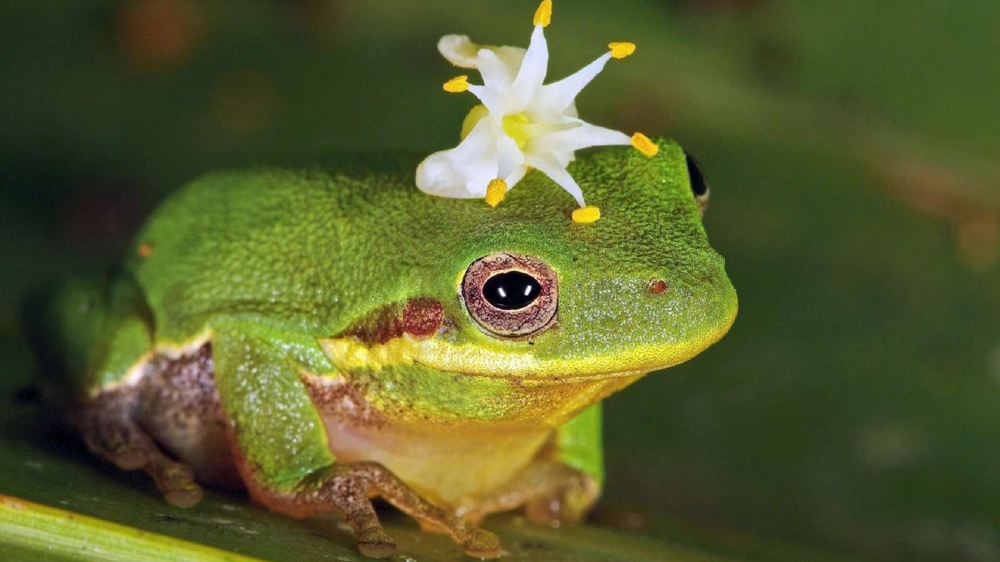

In [5]:
img = Image.open('forg.jpeg') # можно сделать .resize(())
img

Смотрите какая милая жаба, думаю уже тут можно поставить много баллов

In [38]:
x = np.array(img, dtype=np.float32) 

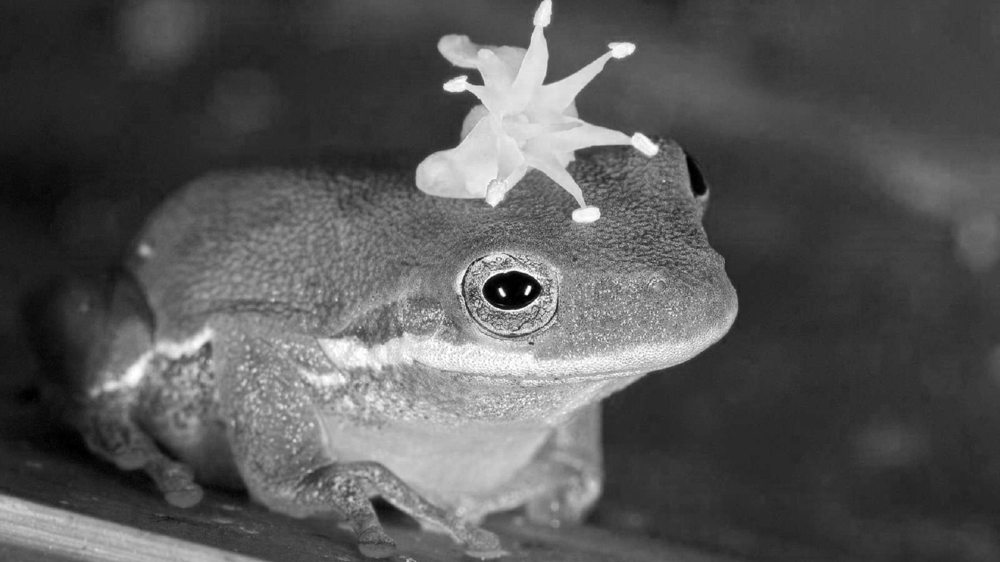

In [68]:
img_red = x.copy()
img_red = img_red[:,:,0]
img_red = Image.fromarray(np.asarray(img_red, dtype=np.uint8))
img_red

In [55]:
def reducer(X, r):
    U, S, V = np.linalg.svd(X, full_matrices=False) # разложение SVD
    Y = U[:,:r] @ np.diag(S[:r]) @ V[:r]
    Y[Y < 0] = 0
    Y[Y > 255] = 255

    return Y

Функция производящая собственно сжатие, в зависимости от r -- числа сингулярных значений, которые мы отставим.

In [58]:
r = 100
new_img = []
for i in range(3):
#     print(x[:,:,i].shape)
    redus = reducer(x[:,:,i], r)
#     print(redus.shape)
    new_img.append(redus.reshape(*redus.shape, 1))
    
new_img = np.concatenate(tuple(new_img), axis=2)

new_img.shape

(1080, 1920, 3)

Проверяем, что все работает, что выходит по итогу трехмерных массив, все нормально

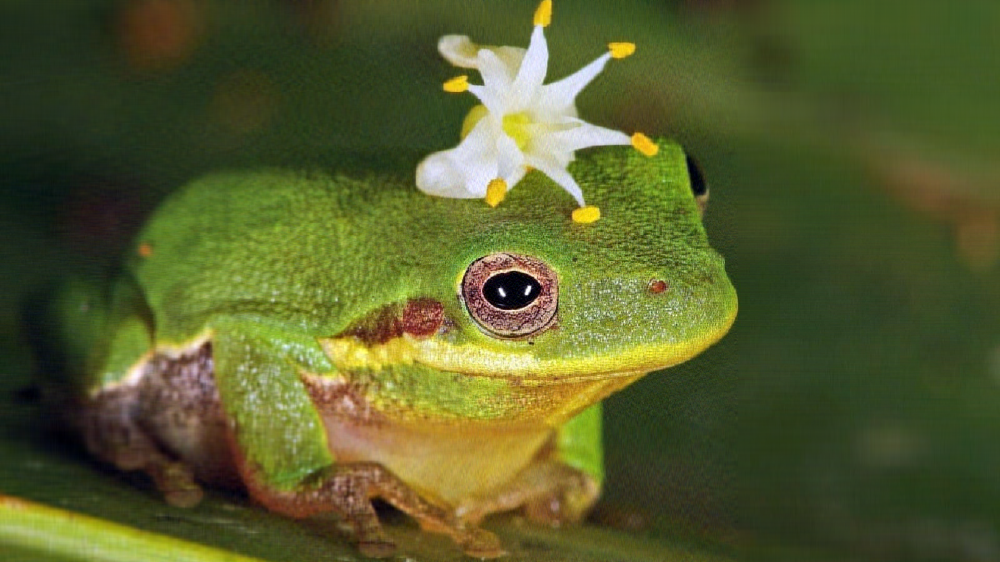

In [61]:
img_compressed = Image.fromarray(np.asarray(new_img, dtype=np.uint8))
img_compressed
# Image.fromarray(np.asarray(Y_r, dtype=np.uint8)).save(f'{r}.png')

Немного пиксельная, но все такая же милая :)  
  
Помучаем нашу жабу еще немного

In [71]:
from IPython.display import display 

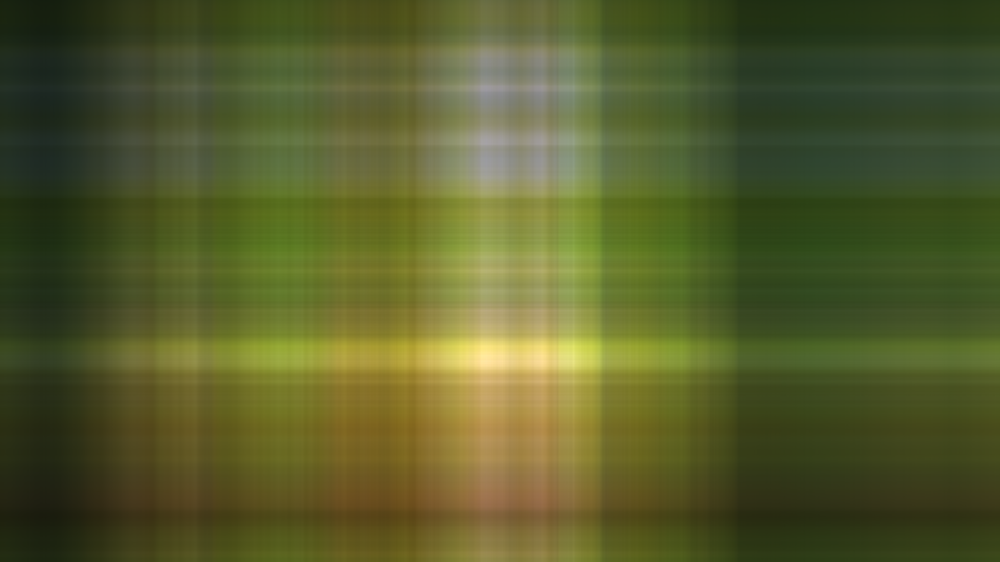

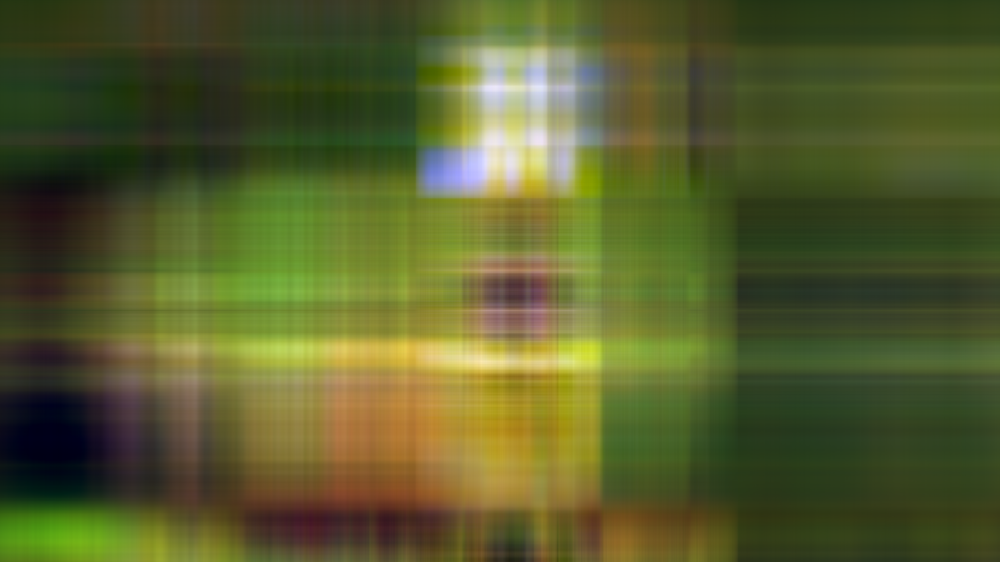

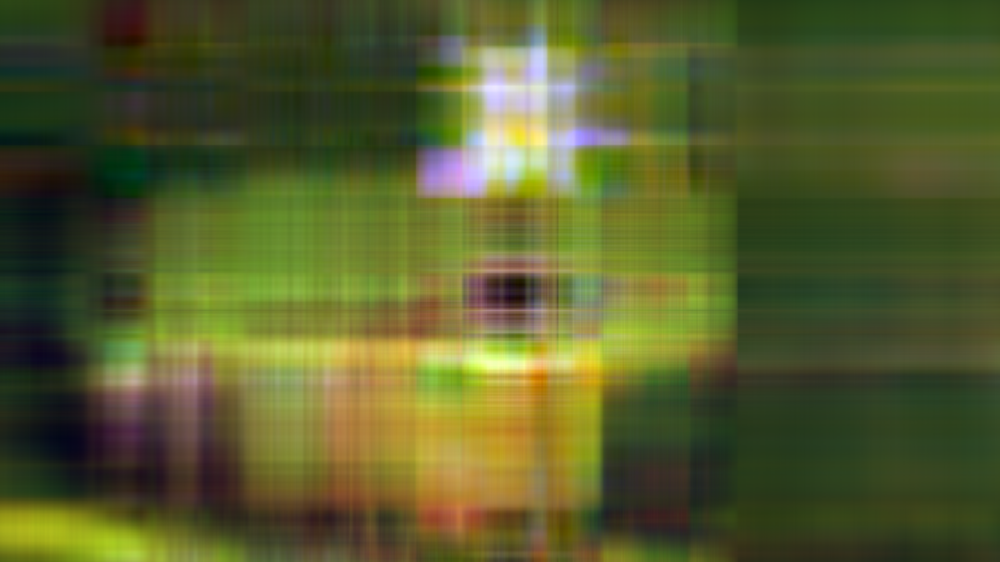

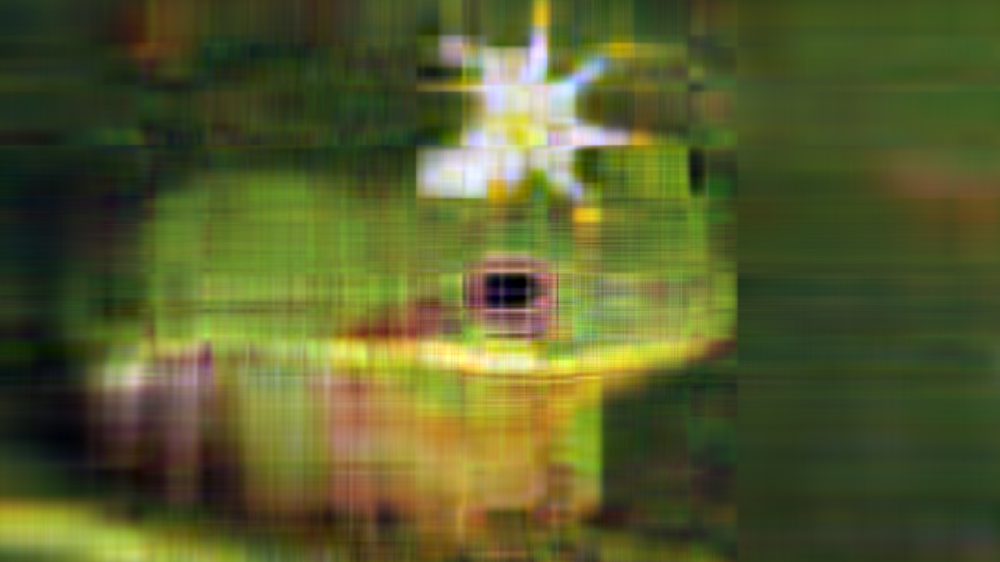

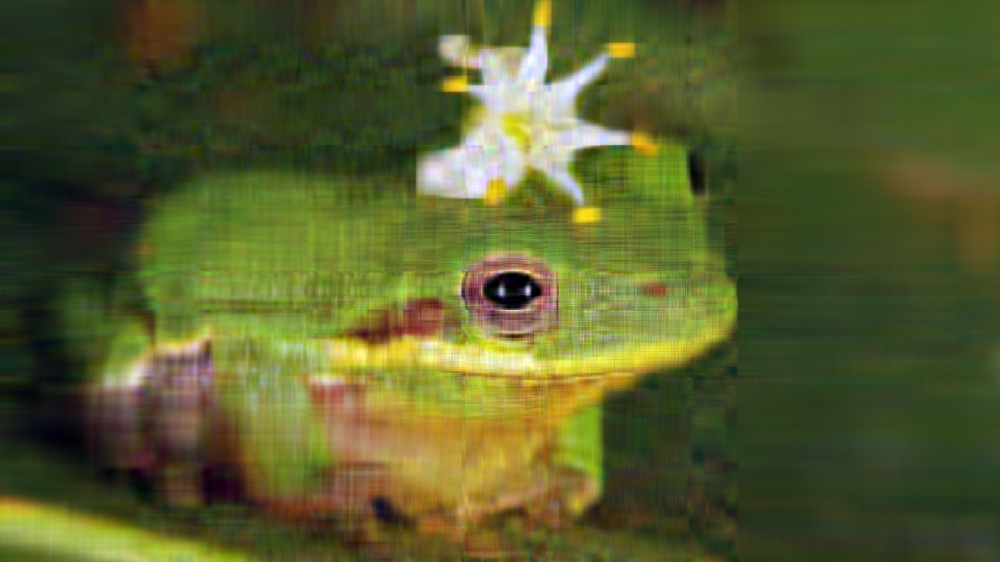

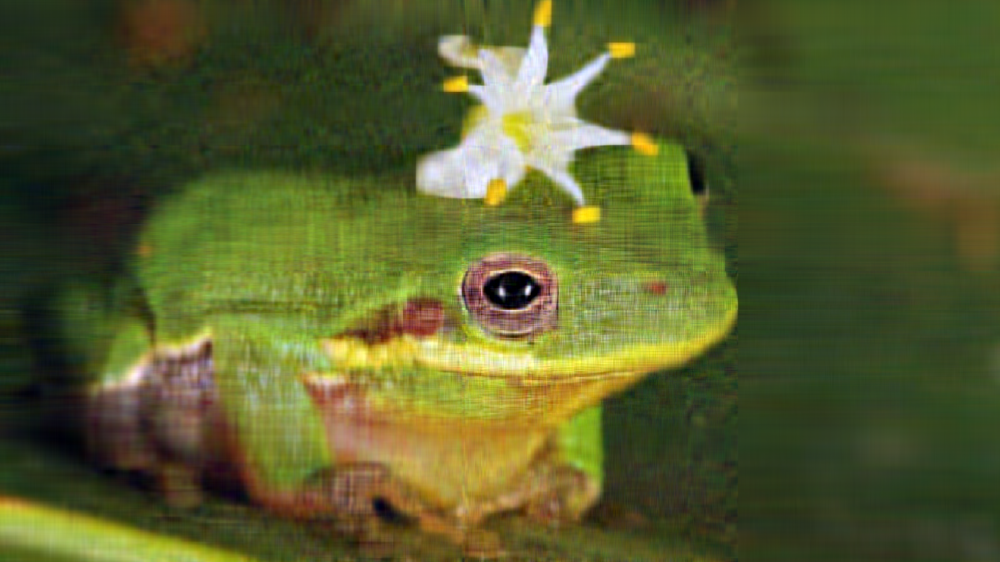

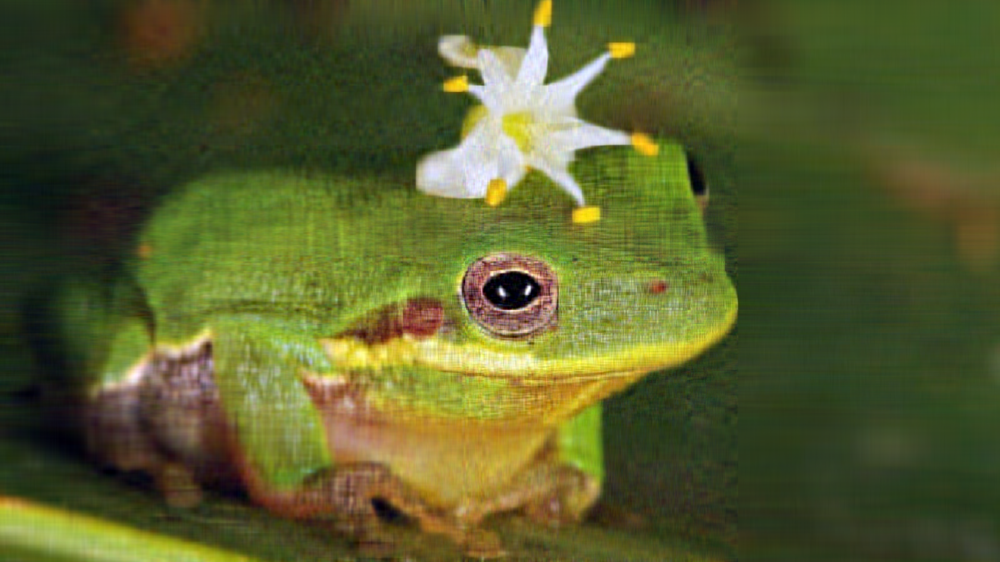

In [72]:
for r in [1, 3, 5, 10, 20, 30, 40]:
    new_img = []
    for i in range(3):
    #     print(x[:,:,i].shape)
        redus = reducer(x[:,:,i], r)
    #     print(redus.shape)
        new_img.append(redus.reshape(*redus.shape, 1))

    new_img = np.concatenate(tuple(new_img), axis=2)
    img_compressed = Image.fromarray(np.asarray(new_img, dtype=np.uint8))
    display(img_compressed)

В целом где-то с 10 сингулярных значений становится понятно, что на изображении. Но даже на 40 кажество оставляет желать лучшего.